In [ ]:
from IPython.display import Audio, display

display(Audio('example/d8a70424-1779-45eb-893a-6de000a69015-_2_.wav', autoplay=True))

# INICIALIZACION DEL MODELO

In [2]:
# definicion de parametros
from argparse import ArgumentParser
from os.path import basename
import matplotlib.pyplot as plt
import torch
import torchaudio


from vap.model import VapGPT, VapConfig, load_older_state_dict
from vap.audio import load_waveform
from vap.utils import (
    batch_to_device,
    everything_deterministic,
    tensor_dict_to_json,
    write_json,
)
from vap.plot_utils import plot_stereo

def get_args():
    parser = ArgumentParser()
    parser.add_argument(
        "-a",
        "--audio",
        type=str,
        help="Path to waveform",
    )
    parser.add_argument(
        "-f",
        "--filename",
        type=str,
        default=None,
        help="Path to waveform",
    )
    parser.add_argument(
        "-sd",
        "--state_dict",
        type=str,
        default="example/VAP_3mmz3t0u_50Hz_ad20s_134-epoch9-val_2.56.pt",
        help="Path to state_dict",
    )
    parser.add_argument(
        "-c",
        "--checkpoint",
        type=str,
        default=None,
        help="Path to trained model",
    )
    parser, _ = VapConfig.add_argparse_args(parser)
    parser.add_argument(
        "--chunk",
        action="store_true",
        help="Process the audio in chunks (longer > 164s on 24Gb GPU audio)",
    )
    parser.add_argument(
        "--chunk_time",
        type=float,
        default=30,
        help="Duration of each chunk processed by model",
    )
    parser.add_argument(
        "--step_time",
        type=float,
        default=5,
        help="Increment to process in a step",
    )
    parser.add_argument(
        "--plot", action="store_true", help="Visualize output (matplotlib)"
    )
    args = parser.parse_args()

    conf = VapConfig.args_to_conf(args)
    return args, conf

In [3]:
import wave
import os


args, conf = get_args()

state_dict= 'example/VAP_3mmz3t0u_50Hz_ad20s_134-epoch9-val_2.56.pt'
# audio_path= 'example/student_long_female_en-US-Wavenet-G.wav'
audio_path= 'example/d8a70424-1779-45eb-893a-6de000a69015-_2_.wav'


# Ruta al archivo WAV
filename = 'ruta/a/tu/archivo.wav'

# Asegurarse de que el archivo existe
if not os.path.exists(audio_path):
    print("El archivo no existe.")
else:
    with wave.open(audio_path, 'rb') as wav_file:
        # Obtener parámetros
        length = wav_file.getnframes()
        rate = wav_file.getframerate()

        # Calcular duración en milisegundos
        duration_ms = (length / rate) * 1000
        print(f"El archivo {audio_path} tiene una duración de {duration_ms:.2f} milisegundos.")


# model = VapGPT(conf)
# sd = torch.load(state_dict)
# model.load_state_dict(sd)

El archivo example/d8a70424-1779-45eb-893a-6de000a69015-_2_.wav tiene una duración de 5980.00 milisegundos.


In [4]:

###########################################################
# Load the model
###########################################################
print("Load Model...")
if args.checkpoint is None:
    print("From state-dict: ", state_dict)
    model = VapGPT(conf)
    sd = torch.load(state_dict)
    model.load_state_dict(sd)
else:
    from vap.train import VAPModel

    print("From Lightning checkpoint: ", args.checkpoint)
    raise NotImplementedError("Not implemeted from checkpoint...")
    # model = VAPModel.load_from_checkpoint(args.checkpoint)
device = "cpu"
if torch.cuda.is_available():
    model = model.to("cuda")
    device = "cuda"
model = model.eval()

Load Model...
From state-dict:  example/VAP_3mmz3t0u_50Hz_ad20s_134-epoch9-val_2.56.pt
########################################
Load pretrained CPC
########################################
Froze EncoderCPC!


# Inferencia de audio entero

In [5]:
##########################################################
# Load the Audio
###########################################################
print('model.sample_rate',model.sample_rate)
waveform, _ = load_waveform(audio_path, sample_rate=model.sample_rate)
duration = round(waveform.shape[-1] / model.sample_rate)
if waveform.shape[0] == 1:
    waveform = torch.cat((waveform, torch.zeros_like(waveform)))
waveform = waveform.unsqueeze(0)

# Maximum known duration with a 24Gb 'NVIDIA GeForce RTX 3090' is 164s
if duration > 160:
    print(
        f"WARNING: Can't fit {duration} > 160s on 24Gb 'NVIDIA GeForce RTX 3090' GPU"
    )
    print("WARNING: Change code if this is not what you want.")
    args.chunk = True

model.sample_rate 16000
processing sample rate


In [6]:
import time

start_time = time.time()  # Guardar el tiempo de inicio

#   ###########################################################
#   # Model Forward
#   ###########################################################
# # if args.chunk:
# #     # raise NotImplementedError("step extraction not implemented")
# #     out = step_extraction(waveform, model, device)
# # else:
# if torch.cuda.is_available():
#     waveform = waveform.to("cuda")
# out = model.probs(waveform)
# out = batch_to_device(out, "cpu")  # to cpu for plot/save

if torch.cuda.is_available():
    waveform = waveform.to("cuda")
out = model.probs(waveform)
out = batch_to_device(out, "cpu")  # to cpu for plot/save



end_time = time.time()  # Guardar el tiempo de fin
elapsed_time = end_time - start_time  # Calcular el tiempo transcurrido
print(f"Tiempo de ejecución: {elapsed_time} segundos")

Tiempo de ejecución: 0.42764830589294434 segundos


In [7]:
for feature_name, feature in out.items():
    print(f"{feature_name}: {feature.shape}")

print('**'*100)
# print(out)

probs: torch.Size([1, 299, 256])
vad: torch.Size([1, 299, 2])
p_now: torch.Size([1, 299, 2])
p_future: torch.Size([1, 299, 2])
H: torch.Size([1, 299])
loss: torch.Size([1, 199])
********************************************************************************************************************************************************************************************************


dict_keys(['probs', 'vad', 'p_now', 'p_future', 'H', 'loss'])
Saved figure as /home/rodrigo/.local/share/jupyter/runtime/kernel-v2-175704T0kaGUTacbJ.png.png
Close figure to continue


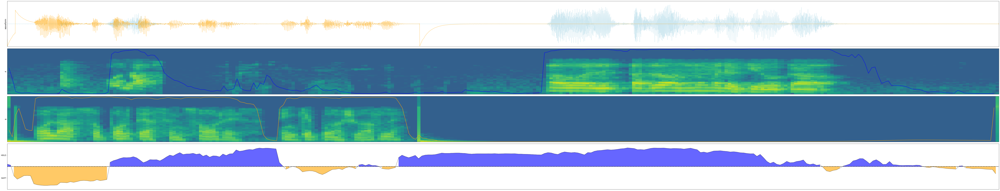

In [8]:
print(out.keys())
vad = out["vad"][0].cpu()
p_ns = out["p_future"][0, :, 0].cpu()
fig, ax = plot_stereo(
    waveform[0].cpu(), p_ns, vad, plot=False, figsize=(100, 20)
)
# Save figure
figpath = args.filename.replace(".json", ".png")
fig.savefig(figpath)
print(f"Saved figure as {figpath}.png")
print("Close figure to continue")
plt.show()

# inferencia por chunks

In [28]:
# audio_path= 'example/interrupcion.wav'
# audio_path= 'example/d8a70424-1779-45eb-893a-6de000a69015-_2_.wav'
# audio_path= 'example/piensa.wav'
audio_path= 'example/interacciones_cortas.wav'
# audio_path= 'example/interrupcion2.wav'




display(Audio(audio_path, autoplay=True))

In [29]:
import torch
import torchaudio
import math
import torchaudio.functional as AF

###########################################################
# Load the Audio
###########################################################
print('model.sample_rate',model.sample_rate)

chunk_duration_ms =20
model_sample_rate = 16000
audio_sample_rate = 48000

waveform, sample_rate = torchaudio.load(audio_path)
# # chunk_samples = math.ceil((chunk_duration_ms / 1000) * sample_rate)

# # if mono and x.shape[0] > 1:
# # waveform = waveform.mean(dim=0).unsqueeze(0)

# if sample_rate is not None:
# if sr != sample_rate:
waveform = AF.resample(waveform, orig_freq=audio_sample_rate, new_freq=model_sample_rate)
# sr = sample_rate

# waveform, _ = load_waveform(audio_path, sample_rate=model.sample_rate)
# duration = round(waveform.shape[-1] / model.sample_rate)
if waveform.shape[0] == 1:
    waveform = torch.cat((waveform, torch.zeros_like(waveform)))
waveform = waveform.unsqueeze(0)


start_time = time.time()  # Guardar el tiempo de inicio

if torch.cuda.is_available():
    waveform = waveform.to("cuda")
out = model.probs(waveform)
out = batch_to_device(out, "cpu")  # to cpu for plot/save



elapsed_time =  time.time() - start_time  
print(f"Tiempo de ejecución: {elapsed_time} segundos")

model.sample_rate 16000
Tiempo de ejecución: 0.09418487548828125 segundos


In [30]:
from pydub import AudioSegment
from pydub.playback import play
import io

import torch
import torch.nn.functional as F

import torch
import torch.nn.functional as F

# Definir el tamaño del chunk y del buffer
chunk_length_ms = 20  # longitud del chunk en milisegundos
buffer_length_ms = 2500  # longitud del buffer en milisegundos




def moving_average(tensor, window_size=5):
    # El tensor de entrada tiene la forma [1, 150, 2]
    # PyTorch conv1d espera una entrada de forma [batch_size, channels, length], por lo que reorganizamos:
    tensor = tensor.transpose(1, 2)  # Ahora la forma es [1, 2, 150]
    
    # Creamos un kernel de convolución para realizar la media móvil
    # El kernel es un vector de unos, normalizado por el tamaño de la ventana
    kernel = torch.ones((1, 1, window_size)) / window_size
    
    # Realizamos la convolución
    # padding=int((window_size-1)/2) asegura que la salida tenga la misma longitud que la entrada
    moving_avg = F.conv1d(tensor, kernel, padding=int((window_size-1)/2), groups=2)
    
    # Revertimos la transposición para volver a la forma original [1, 150, 2]
    moving_avg = moving_avg.transpose(1, 2)
    
    return moving_avg



accumulated_means_p_now = torch.empty(1, 0, 2)  # Asume forma inicial [1, 0, 2] para acumulación
accumulated_means_p_future = torch.empty(1, 0, 2)  # Asume forma inicial [1, 0, 2] para acumulación

# Cargar archivo WAV
audio = AudioSegment.from_wav(audio_path)


# Crear un buffer inicial vacío de 2 segundos
buffer = AudioSegment.silent(duration=buffer_length_ms)

# Calcular cuántos chunks hay en el buffer
chunks_in_buffer = buffer_length_ms // chunk_length_ms

# Iterar sobre el archivo de audio en chunks de 20 ms
for i in range(0, len(audio), chunk_length_ms):
    start_time = time.time()  # Guardar el tiempo de inicio

    chunk = audio[i:i+chunk_length_ms]

    # Añadir el chunk nuevo al final del buffer
    buffer = buffer.append(chunk, crossfade=0)

    # Si el buffer es más largo que 2 segundos, recortar el chunk más antiguo
    if len(buffer) > buffer_length_ms:
        buffer = buffer[-buffer_length_ms:]  # Mantener solo los últimos 2 segundos

    # Opcional: reproducir el buffer para verificar (solo para pruebas, quitar en producción)
    # play(buffer)

    # Convertir el buffer a bytes
    buf = io.BytesIO()
    buffer.export(buf, format="wav")  # Exportar el buffer como WAV en memoria

    # Cargar el buffer como un tensor en PyTorch
    buf.seek(0)  # Volver al inicio del buffer para lectura
    waveform, sample_rate = torchaudio.load(buf)
    # Mostrar estado del buffer en cada iteración (para depuración)
    print(f"-----Iteración {i//chunk_length_ms}: Longitud del buffer = {len(buffer)} ms")

    waveform = AF.resample(waveform, orig_freq=audio_sample_rate, new_freq=model_sample_rate)
    # sr = sample_rate

    # waveform, _ = load_waveform(audio_path, sample_rate=model.sample_rate)
    # duration = round(waveform.shape[-1] / model.sample_rate)
    if waveform.shape[0] == 1:
        waveform = torch.cat((waveform, torch.zeros_like(waveform)))
    waveform = waveform.unsqueeze(0)



    if torch.cuda.is_available():
        waveform = waveform.to("cuda")
    out = model.probs(waveform)
    out = batch_to_device(out, "cpu")  # to cpu for plot/save
    
    
    accumulated_means_p_now =  torch.cat((accumulated_means_p_now, out['p_now'][:, -5:, :].mean(dim=1, keepdim=True)), dim=1) 
    accumulated_means_p_future = torch.cat((accumulated_means_p_future, out['p_future'][:, -5:, :].mean(dim=1, keepdim=True)), dim=1)  # Concatenar a lo largo de la segunda dimensión


    elapsed_time =  time.time() - start_time  
    print(f"Tiempo de ejecución: {elapsed_time} segundos")
    # Mostrar el resultado
    for feature_name, feature in out.items():
        print(f"{feature_name}: {feature.shape}")



print("Forma del tensor promediado:", accumulated_means_p_now.shape)
print("Forma del tensor promediado:", accumulated_means_p_future.shape)
# print("Tensor promediado:", p_mean)

-----Iteración 0: Longitud del buffer = 2500 ms
Tiempo de ejecución: 0.031013011932373047 segundos
probs: torch.Size([1, 125, 256])
vad: torch.Size([1, 125, 2])
p_now: torch.Size([1, 125, 2])
p_future: torch.Size([1, 125, 2])
H: torch.Size([1, 125])
loss: torch.Size([1, 25])
-----Iteración 1: Longitud del buffer = 2500 ms
Tiempo de ejecución: 0.02659296989440918 segundos
probs: torch.Size([1, 125, 256])
vad: torch.Size([1, 125, 2])
p_now: torch.Size([1, 125, 2])
p_future: torch.Size([1, 125, 2])
H: torch.Size([1, 125])
loss: torch.Size([1, 25])
-----Iteración 2: Longitud del buffer = 2500 ms
Tiempo de ejecución: 0.026415109634399414 segundos
probs: torch.Size([1, 125, 256])
vad: torch.Size([1, 125, 2])
p_now: torch.Size([1, 125, 2])
p_future: torch.Size([1, 125, 2])
H: torch.Size([1, 125])
loss: torch.Size([1, 25])
-----Iteración 3: Longitud del buffer = 2500 ms
Tiempo de ejecución: 0.0265805721282959 segundos
probs: torch.Size([1, 125, 256])
vad: torch.Size([1, 125, 2])
p_now: torch.S

In [ ]:
# import time


# #   ###########################################################
# #   # Model Forward
# #   ###########################################################
# # # if args.chunk:
# # #     # raise NotImplementedError("step extraction not implemented")
# # #     out = step_extraction(waveform, model, device)
# # # else:
# # if torch.cuda.is_available():
# #     waveform = waveform.to("cuda")
# # out = model.probs(waveform)
# # out = batch_to_device(out, "cpu")  # to cpu for plot/save

# start_time = time.time()  # Guardar el tiempo de inicio

# if torch.cuda.is_available():
#     waveform = waveform.to("cuda")
# out = model.probs(waveform)
# out = batch_to_device(out, "cpu")  # to cpu for plot/save



# elapsed_time =  time.time() - start_time  
# print(f"Tiempo de ejecución: {elapsed_time} segundos")

In [ ]:

waveform, sample_rate = torchaudio.load(audio_path)
# # chunk_samples = math.ceil((chunk_duration_ms / 1000) * sample_rate)

# # if mono and x.shape[0] > 1:
# # waveform = waveform.mean(dim=0).unsqueeze(0)

# if sample_rate is not None:
# if sr != sample_rate:
waveform = AF.resample(waveform, orig_freq=audio_sample_rate, new_freq=model_sample_rate)
# sr = sample_rate

# waveform, _ = load_waveform(audio_path, sample_rate=model.sample_rate)
# duration = round(waveform.shape[-1] / model.sample_rate)
if waveform.shape[0] == 1:
    waveform = torch.cat((waveform, torch.zeros_like(waveform)))
waveform = waveform.unsqueeze(0)


start_time = time.time()  # Guardar el tiempo de inicio

if torch.cuda.is_available():
    waveform = waveform.to("cuda")
out = model.probs(waveform)
out = batch_to_device(out, "cpu")  # to cpu for plot/save



elapsed_time =  time.time() - start_time  
print(f"Tiempo de ejecución: {elapsed_time} segundos")





import torch
import matplotlib.pyplot as plt


def plot_probabilities_calculadas(data):
    """
    Función para graficar las probabilidades de dos personas contenidas en un tensor.
    
    Parámetros:
        data (torch.Tensor): Tensor de dimensiones [1, n, 2] donde n es el número de probabilidades
                             y 2 representa las probabilidades de dos personas.
    """
    # Verificar que el tensor tiene las dimensiones correctas
    assert data.dim() == 3 and data.size(0) == 1 and data.size(2) == 2, "El tensor debe ser de tamaño [1, n, 2]"
    
    # Extraer las probabilidades para cada persona
    prob_person1 = data[0, :, 0]
    prob_person2 = data[0, :, 1]

    # Crear la figura con tamaño especificado
    plt.figure(figsize=(100, 10))

    # Graficar las probabilidades
    plt.plot(prob_person1, color='blue', label='Persona 1')
    plt.plot(prob_person2, color='red', label='Persona 2')

    # Ajustar los límites del eje x para eliminar el espacio en blanco al inicio
    plt.xlim(left=0)  # Esto fija el límite izquierdo del eje x en 0

    # Añadiendo título y etiquetas
    plt.title('Probabilidades por Persona')
    plt.xlabel('Índice')
    plt.ylabel('Probabilidad')
    plt.legend()

    # Mostrar la gráfica
    plt.show()

Tiempo de ejecución: 0.08261609077453613 segundos


dict_keys(['probs', 'vad', 'p_now', 'p_future', 'H', 'loss'])
Saved figure as /home/rodrigo/.local/share/jupyter/runtime/kernel-v2-175704T0kaGUTacbJ.png.png
Close figure to continue


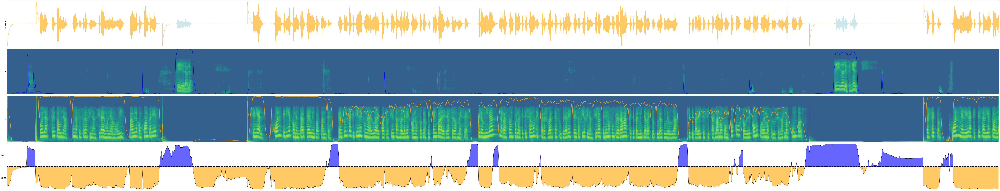

dict_keys(['probs', 'vad', 'p_now', 'p_future', 'H', 'loss'])
Saved figure as /home/rodrigo/.local/share/jupyter/runtime/kernel-v2-175704T0kaGUTacbJ.png.png
Close figure to continue


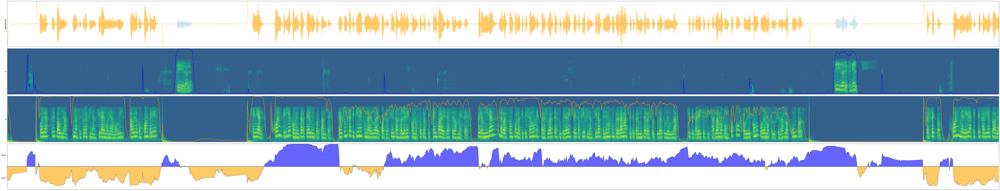

dict_keys(['probs', 'vad', 'p_now', 'p_future', 'H', 'loss'])
Saved figure as /home/rodrigo/.local/share/jupyter/runtime/kernel-v2-175704T0kaGUTacbJ.png.png
Close figure to continue


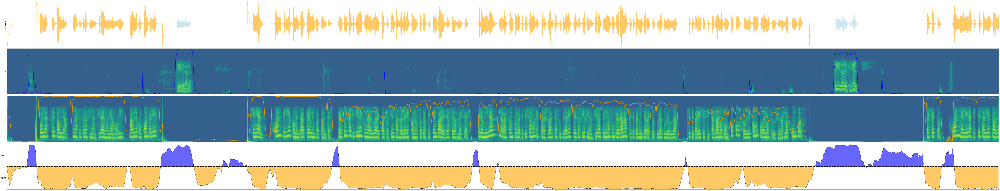

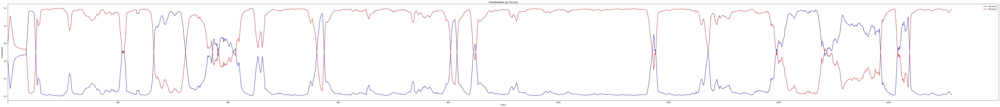

dict_keys(['probs', 'vad', 'p_now', 'p_future', 'H', 'loss'])
Saved figure as /home/rodrigo/.local/share/jupyter/runtime/kernel-v2-175704T0kaGUTacbJ.png.png
Close figure to continue


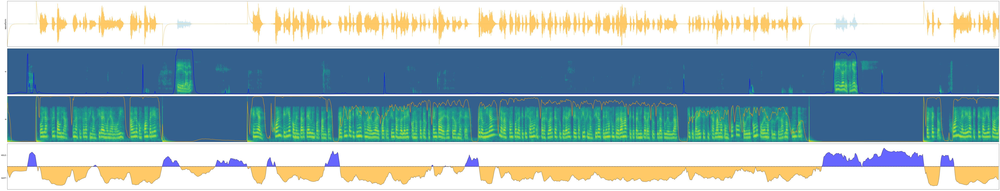

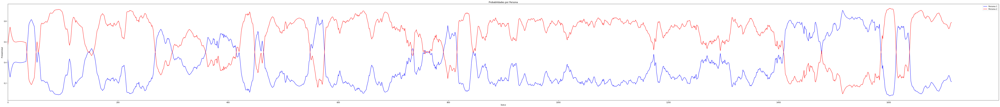

In [ ]:
import matplotlib.pyplot as plt


############# p now
print(out.keys())
vad = out["vad"][0].cpu()
p_ns = out["p_now"][0, :, 0].cpu()
fig, ax = plot_stereo(
    waveform[0].cpu(), p_ns, vad, plot=False, figsize=(100, 20)
)
# Save figure
figpath = args.filename.replace(".json", ".png")
fig.savefig(figpath)
print(f"Saved figure as {figpath}.png")
print("Close figure to continue")
plt.show()

############# p future
print(out.keys())
vad = out["vad"][0].cpu()
p_ns = out["p_future"][0, :, 0].cpu()
fig, ax = plot_stereo(
    waveform[0].cpu(), p_ns, vad, plot=False, figsize=(100, 20)
)
# Save figure
figpath = args.filename.replace(".json", ".png")
fig.savefig(figpath)
print(f"Saved figure as {figpath}.png")
print("Close figure to continue")
plt.show()



############# p now
print(out.keys())
vad = out["vad"][0].cpu()
p_ns = accumulated_means_p_now[0, :, 0].cpu()
fig, ax = plot_stereo(
    waveform[0].cpu(), p_ns, vad, plot=False, figsize=(100, 20)
)
# Save figure
figpath = args.filename.replace(".json", ".png")
fig.savefig(figpath)
print(f"Saved figure as {figpath}.png")
print("Close figure to continue")
plt.show()
plot_probabilities_calculadas(accumulated_means_p_now)

############# p future
print(out.keys())
vad = out["vad"][0].cpu()
p_ns = accumulated_means_p_future[0, :, 0].cpu()
fig, ax = plot_stereo(
    waveform[0].cpu(), p_ns, vad, plot=False, figsize=(100, 20)
)
# Save figure
figpath = args.filename.replace(".json", ".png")
fig.savefig(figpath)
print(f"Saved figure as {figpath}.png")
print("Close figure to continue")
plt.show()
plot_probabilities_calculadas(accumulated_means_p_future)